In [1]:
from collections import OrderedDict
from typing import Dict, List, Optional, Tuple
import os
import flwr as fl
import numpy as np
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader, random_split
from torchvision.datasets import CIFAR10
from torchsummary import summary
from torchvision.io import read_image
from torch.utils.data import Dataset
from torchvision.transforms import ToTensor
from enum import Enum
from tqdm import tqdm
import gc
from numba import cuda
import networkx as nx
import random
import time
import enum
import threading
from matplotlib import pyplot as plt
from zod import ZodFrames
from zod import ZodSequences
import zod.constants as constants
from zod.constants import Camera, Lidar, Anonymization, AnnotationProject
import json
from torch.utils.tensorboard import SummaryWriter
from datetime import datetime
import requests
import cv2
from flask import Flask, request, jsonify
import multiprocessing
from zod.visualization.oxts_on_image import visualize_oxts_on_image
from zod.constants import Camera
from zod.data_classes.calibration import Calibration
from zod.data_classes.oxts import EgoMotion
from zod.utils.polygon_transformations import polygons_to_binary_mask
from zod.utils.geometry import (
    get_points_in_camera_fov,
    project_3d_to_2d_kannala,
    transform_points,
)
import pytorch_lightning as pl
import segmentation_models_pytorch as smp
from pprint import pprint
from torch.utils.data import DataLoader
from PIL import Image
from statistics import mean

/tmp/ipykernel_1693055/1098950539.py:42: DeprecationWarning: The 'zod.data_classes.oxts' module has been deprecated and will be removed in a future version. Please use the 'zod.data_classes.ego_motion' module instead.
  from zod.data_classes.oxts import EgoMotion


## static params

In [2]:
NUM_OUTPUT = 51
IMG_SIZE = 256
RUN_PRETRAINED = True
BATCH_SIZE = 32
VAL_FACTOR = 0.15
SUBSET_FACTOR = 0.03
USE_GPU = True
NUM_GLOBAL_ROUNDS = 3
NUM_LOCAL_EPOCHS = 10
PRINT_DEBUG_DATA = True
NUM_WORKERS = 0 # os.cpu_count()
FRAMES_IMAGE_MEAN = [0.337, 0.345, 0.367]
FRAMES_IMAGE_STD = [0.160, 0.180, 0.214]
DEVICE = torch.device("cuda" if USE_GPU else "cpu")
TRAIN_FRAMES_PATH = "../GroundTruth/training_seg_annotated_frames.json"
VAL_FRAMES_PATH = "../GroundTruth/validation_seg_annotated_frames.json"
STORED_GROUND_TRUTH_PATH = "cached_gt/hp_gt_smp.json"
STORED_BALANCED_DS_PATH = "cached_gt/balanced_frames.txt"
DATASET_ROOT = "/mnt/ZOD"
ZENSEACT_DATASET_ROOT = "/staging/dataset_donation/round_2"

TARGET_DISTANCES = [5, 10, 15, 20, 25, 30, 35, 40, 50, 60, 70, 80, 95, 110, 125, 145, 165]

#TARGET_DISTANCES = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85] 

with open("frames_with_less_than_165m_hp.json") as f:
    short_frames = json.load(f)
UNUSED_FRAMES = set(short_frames)

print(f"PyTorch={torch.__version__}. Pytorch vision={torchvision.__version__}. Flower={fl.__version__}")
print(f"Training will run on: {DEVICE}s")

""" path to tensor board persistent folders"""
now = datetime.now().strftime("%Y-%m-%d_%H:%M:%S")
TB_PATH = f"TensorBoard/runs{now}"
TB_CENTRALIZED_SUB_PATH = "TensorBoard_Centralized/loss"
TB_FEDERATED_SUB_PATH = "TensorBoard_Federated/loss"
TB_SWARM_SUB_PATH = "TensorBoard_Swarm/loss"

PyTorch=2.0.0+cu117. Pytorch vision=0.15.1+cu117. Flower=1.3.0
Training will run on: cudas


## datasets

In [35]:
class ZODImporter:
    def __init__(
        self,
        root=DATASET_ROOT,
        subset_factor=SUBSET_FACTOR,
        img_size=IMG_SIZE,
        batch_size=BATCH_SIZE,
        tb_path=TB_PATH,
        zod_frames=None,
        training_frames=None, 
        validation_frames=None
    ):
        if(zod_frames == None):
            self.zod_frames = ZodFrames(dataset_root=root, version='full')
            self.training_frames_all = self.zod_frames.get_split(constants.TRAIN)
            self.validation_frames_all = self.zod_frames.get_split(constants.VAL)
            
            self.training_frames = list(self.training_frames_all)[: int(len(self.training_frames_all) * subset_factor)]
            self.validation_frames = list(self.validation_frames_all)[: int(len(self.validation_frames_all) * subset_factor)]

            self.training_frames = [x for x in tqdm(self.training_frames) if self.is_valid(x)]
            self.validation_frames = [x for x in tqdm(self.validation_frames) if self.is_valid(x)]
        else:
            self.zod_frames = zod_frames
            self.training_frames = training_frames
            self.validation_frames = validation_frames
            
        print("length of training_frames subset:", len(self.training_frames))
        print("length of test_frames subset:", len(self.validation_frames))

        self.img_size = img_size
        self.batch_size = batch_size
        self.tb_path = tb_path

        
    def is_valid(self, frame_id):
        return frame_id not in UNUSED_FRAMES
        
    def load_datasets(self, num_clients: int):
        seed = 42
        mean=[0.485, 0.456, 0.406]
        std=[0.229, 0.224, 0.225]
        
        transform = transforms.Compose([
            transforms.ToTensor(),
            #transforms.Normalize(FRAMES_IMAGE_MEAN, FRAMES_IMAGE_STD),
            transforms.Normalize(mean, std),
            transforms.Resize(size=(self.img_size, self.img_size), antialias=True)
        ])

        trainset = ZodDataset(zod_frames=self.zod_frames, frames_id_set=self.training_frames, transform=transform)
        testset = ZodDataset(zod_frames=self.zod_frames, frames_id_set=self.validation_frames, transform=transform)

        # Split training set into `num_clients` partitions to simulate different local datasets
        partition_size = len(trainset) // num_clients

        lengths = [partition_size]
        if num_clients > 1:
            lengths = [partition_size] * (num_clients - 1)
            lengths.append(len(trainset) - sum(lengths))

        datasets = random_split(trainset, lengths, torch.Generator().manual_seed(seed))

        # Split each partition into train/val and create DataLoader
        trainloaders, valloaders = [], []
        lengths_train, lengths_val = [], []
        for ds in datasets:
            len_val = int(len(ds) * VAL_FACTOR)
            len_train = int(len(ds) - len_val)
            lengths_train.append(len_train)
            lengths_val.append(len_val)
            lengths = [len_train, len_val]
            ds_train, ds_val = random_split(ds, lengths, torch.Generator().manual_seed(seed))
            trainloaders.append(DataLoader(ds_train,batch_size=self.batch_size, shuffle=True, num_workers=NUM_WORKERS))
            valloaders.append(DataLoader(ds_val, batch_size=self.batch_size, num_workers=NUM_WORKERS))

        len_complete_val = int(len(trainset) * VAL_FACTOR)
        len_complete_train = int(len(trainset) - len_complete_val)
        train_split, val_split = random_split(
            trainset,
            [len_complete_train, len_complete_val],
            torch.Generator().manual_seed(seed),
        )

        completeTrainloader = DataLoader(train_split, batch_size=self.batch_size, num_workers=NUM_WORKERS)
        completeValloader = DataLoader(val_split, batch_size=self.batch_size, num_workers=NUM_WORKERS)

        testloader = DataLoader(testset, batch_size=self.batch_size, num_workers=NUM_WORKERS)

        """report to tensor board"""
        save_dataset_tb_plot(self.tb_path, lengths_train, "training", seed)
        save_dataset_tb_plot(self.tb_path, lengths_val, "validation", seed)

        return (
            trainloaders,
            valloaders,
            testloader,
            completeTrainloader,
            completeValloader,
        )

class ZodDataset(Dataset):
    def __init__(
        self,
        zod_frames,
        frames_id_set,
        transform=None,
        target_transform=None,
    ):
        self.zod_frames = zod_frames
        self.frames_id_set = frames_id_set
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.frames_id_set)
    
    def __getitem__(self, idx):
        
        # load frame
        frame_idx = self.frames_id_set[idx]
        frame = self.zod_frames[frame_idx]
        
        # get image
        image_path = frame.info.get_key_camera_frame(Anonymization.DNAT).filepath
        image = np.array(Image.open(image_path).convert("RGB"))
        
        # extract ground truth
        label = get_ground_truth(self.zod_frames, frame_idx)
        
        # create sample
        sample = dict(image=image, label=label)
        
        # resize images
        image = np.array(Image.fromarray(sample["image"]).resize((IMG_SIZE, IMG_SIZE), Image.BILINEAR))
        
        # convert to other format HWC -> CHW
        #sample["image"] = np.moveaxis(image, -1, 0)
        sample["label"] = np.expand_dims(label, 0)
        
        if(self.transform):
            sample["image"] = self.transform(sample["image"])
        
        return sample

def get_ground_truth(zod_frames, frame_id):
    # get frame
    zod_frame = zod_frames[frame_id]

    # extract oxts
    oxts = zod_frame.oxts

    # get timestamp
    key_timestamp = zod_frame.info.keyframe_time.timestamp()

    try:
        # get posses associated with frame timestamp
        current_pose = oxts.get_poses(key_timestamp)

        # transform poses
        all_poses = oxts.poses[oxts.timestamps>=key_timestamp]
        transformed_poses = np.linalg.pinv(current_pose) @ all_poses

        # get translations
        translations = transformed_poses[:, :3, 3]

        # calculate acc diff distance
        distances = np.linalg.norm(np.diff(translations, axis=0), axis=1)
        accumulated_distances = np.cumsum(distances).astype(int).tolist()

        # get the poses that each have a point having a distance from TARGET_DISTANCES
        pose_idx = [accumulated_distances.index(i) for i in TARGET_DISTANCES]
        used_poses = transformed_poses[pose_idx]

    except:
        print("detected invalid frame: ", frame_id)
        return np.array([])

    #print(used_poses.shape)
    points = used_poses[:, :3, -1]
    return points.flatten().astype(np.float32)

def compute_loss(pred_trajectory, target_trajectory):
    # L1 or L2 distance: matrix of size bsx40x3
    #if (L1):
    #    loss = torch.abs(pred_trajectory - target_trajectory)
    #else:
    
    #loss = nn.MSELoss()
    #pred_trajectory = torch.from_numpy(reshape_ground_truth(pred_trajectory))
    #target_trajectory = torch.from_numpy(reshape_ground_truth(target_trajectory))
    #loss = loss(pred_trajectory, target_trajectory)
    
    #loss = torch.pow(pred_trajectory - target_trajectory, 2)
    #loss = torch.sum(loss)
    
    #loss_elementWise = [torch.sqrt(torch.sum(torch.pow(p - t, 2))).item() for p,t in zip(pred_trajectory, target_trajectory)]
    #loss_elementWise = sum(loss_elementWise)
    
    #criterion = nn.MSELoss()
    #loss = torch.sqrt(criterion(pred_trajectory, target_trajectory))
    
    criterion = nn.L1Loss()
    loss = criterion(pred_trajectory, target_trajectory)
    
    return loss

def compute_metrics(pred_trajectory, target_trajectory):

    # L1 and L2 distance: matrix of size BSx40x3
    L1_loss = torch.abs(pred_trajectory - target_trajectory)
    L2_loss = torch.pow(pred_trajectory - target_trajectory, 2)

    # BSx40x3 -> BSx3 average over the predicted points
    L1_loss = L1_loss.mean(axis=1)
    L2_loss = L2_loss.mean(axis=1)

    # split into losses for each axis and an avg loss across 3 axes
    # All returned tensors have shape (BS)
    return {
            'L1_loss':   L1_loss.mean(axis=1),
            'L1_loss_x': L1_loss[:, 0],
            'L1_loss_y': L1_loss[:, 1],
            'L1_loss_z': L1_loss[:, 2],
            'L2_loss':   L2_loss.mean(axis=1),
            'L2_loss_x': L2_loss[:, 0],
            'L2_loss_y': L2_loss[:, 1],
            'L2_loss_z': L2_loss[:, 2]}
    

def save_dataset_tb_plot(tb_path, sample_distribution, subtitle, seed):
    plt.bar(list(range(1, len(sample_distribution) + 1)), sample_distribution)
    plt.xlabel("Partitions")
    plt.ylabel("Samples")
    plt.suptitle("Distribution of samples")
    plt.title("%s, seed: %s" % (subtitle, seed)),

    """report to tensor board"""
    writer = SummaryWriter(tb_path)
    writer.add_figure("sample_distribution/%s" % (subtitle), plt.gcf(), global_step=0)
    writer.close()


def reshape_ground_truth(label, output_size=NUM_OUTPUT):
    return label.reshape(((NUM_OUTPUT // 3), 3))

def visualize_HP_on_image(zod_frames, frame_id, preds=None, showImg=True):
    """Visualize oxts track on image plane."""
    camera=Camera.FRONT
    zod_frame = zod_frames[frame_id]
    image = zod_frame.get_image(Anonymization.DNAT)
    calibs = zod_frame.calibration
    points_gt = get_ground_truth(zod_frames, frame_id)
    preds_row = preds.copy()
    points = reshape_ground_truth(points_gt)
    
    circle_size = 15
    
    # transform point to camera coordinate system
    T_inv = np.linalg.pinv(calibs.get_extrinsics(camera).transform)
    camerapoints = transform_points(points[:, :3], T_inv)

    # filter points that are not in the camera field of view
    points_in_fov = get_points_in_camera_fov(calibs.cameras[camera].field_of_view, camerapoints)
    points_in_fov = points_in_fov[0]

    # project points to image plane
    xy_array = project_3d_to_2d_kannala(
        points_in_fov,
        calibs.cameras[camera].intrinsics[..., :3],
        calibs.cameras[camera].distortion,
    )
    
    ground_truth_color = (19, 80, 41)
    preds_color = (161, 65, 137)
    
    points = []
    for i in range(xy_array.shape[0]):
        x, y = int(xy_array[i, 0]), int(xy_array[i, 1])
        cv2.circle(image, (x,y), circle_size, ground_truth_color, -1)
        points.append([x,y])
    
    """Draw a line in image."""
    def draw_line(image, line, color):
        return cv2.polylines(image.copy(), [np.round(line).astype(np.int32)], isClosed=False, color=color, thickness=20)
    
    image = draw_line(image, points, ground_truth_color)
    
    # transform and draw predictions 
    if(preds is not None):
        preds = reshape_ground_truth(preds)
        predpoints = transform_points(preds[:, :3], T_inv)
        predpoints_in_fov = get_points_in_camera_fov(calibs.cameras[camera].field_of_view, predpoints)
        predpoints_in_fov = predpoints_in_fov[0]
        
        xy_array_preds = project_3d_to_2d_kannala(
            predpoints_in_fov,
            calibs.cameras[camera].intrinsics[..., :3],
            calibs.cameras[camera].distortion,
        )
        preds = []
        for i in range(xy_array_preds.shape[0]):
            x, y = int(xy_array_preds[i, 0]), int(xy_array_preds[i, 1])
            cv2.circle(image, (x,y), circle_size, preds_color, -1)
            preds.append([x,y])
        
        #preds = preds[:(len(preds)//2)]
        image = draw_line(image, preds, preds_color)
        
    #plt.imsave(f'inference_{frame_id}.png', image)
    if(showImg):
        plt.clf()
        plt.axis("off")
        plt.imshow(image)
    return image, points_gt, preds_row
    
def visualize_multiple(zod_frames, frame_ids, model=None):
    if(model):
        images = [visualize_HP_on_image(zod_frames, frame_id, predict(model.to(DEVICE), zod_frames, frame_id), showImg=False) for frame_id in frame_ids]
    else:
        images = [visualize_HP_on_image(zod_frames, frame_id, None, showImg=False) for frame_id in frame_ids]
        
    plt.figure(figsize=(60,60))
    columns = 4
    plt.subplots_adjust(wspace=0, hspace=0)
    for i, image in enumerate(images):
        plt.subplot(len(images) // columns + 1, columns, i + 1)
        plt.gca().set_title(frame_ids[i], fontsize=20)
        plt.imshow(image[0])  
    
def get_transformed_image(zod_frames, frame_id):
    frame = zod_frames[frame_id]
    image_path = frame.info.get_key_camera_frame(Anonymization.DNAT).filepath
    image = np.array(Image.open(image_path).convert("RGB"))
    image = np.array(Image.fromarray(image).resize((IMG_SIZE, IMG_SIZE), Image.BILINEAR))
    transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Resize(size=(IMG_SIZE, IMG_SIZE), antialias=True)
        ])
    image = transform(image).unsqueeze(0).to(DEVICE)
    return image

def predict(model, zod_frames, frame_id):
    image = get_transformed_image(zod_frames, frame_id).to(DEVICE)
    outputs, ema_output = model(image)
    outputs.squeeze(0)
    ema_output.squeeze(0)
    label = torch.from_numpy(get_ground_truth(zod_frames, frame_id)).to(DEVICE)
    
    #loss_fn = torch.nn.L1Loss()
    #loss = loss_fn(label, outputs)
    
    loss = compute_loss(label, ema_output)
    
    print(f'frame: {frame_id}, loss: {loss.item()}')
    preds = ema_output.cpu().detach().numpy()
    return preds


## models

In [28]:
model_type = 'mobile_net'
useEma = True
output_size = 51
from ema_pytorch import EMA

class PT_Model(pl.LightningModule):
    def __init__(self, cid=0) -> None:
        super(PT_Model, self).__init__()
        
        self.model = None
        if(model_type == 'resnet18'):
            self.model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        elif(model_type == 'mobile_net'):
            self.model = models.mobilenet_v3_large(weights=models.MobileNet_V3_Large_Weights.IMAGENET1K_V1)

        self.change_head_net()
        self.useEma = useEma
        self.ema = None

        if(self.useEma):
            self.ema = EMA(
                self.model,
                beta=0.995,
                update_after_step=100,
                power=3/4,
                inv_gamma=1.0
            )

        self.is_pretrained = True
        self.loss_fn = torch.nn.L1Loss()
        self.cid = cid
        
        # pytorch imagenet calculated mean/std
        self.mean=[0.485, 0.456, 0.406]
        self.std=[0.229, 0.224, 0.225]
        
        self.epoch_counter = 1
        self.tb_log = {}
        self.create_intermediate_steps()
        

    def forward(self, image):
        label = self.model(image)

        if(self.useEma):
            ema_label = self.ema(image)
            return label, ema_label

        return label, None

    def model_parameters(self):
        return self.model.fc.parameters()
    
    def change_head_net(self):
        num_ftrs = 0

        if(model_type == 'resnet18'):
            num_ftrs = self.model.fc.in_features
        elif(model_type == 'mobile_net'):
            num_ftrs = self.model.classifier[-1].in_features

        head_net = nn.Sequential(
            nn.Linear(num_ftrs, 1024, bias=True),
            nn.ReLU(inplace=True),
            nn.Linear(1024, 512, bias=True),
            nn.ReLU(inplace=True),
            nn.Linear(512, output_size, bias=True),
        )

        if(model_type == 'resnet18'):
            self.model.fc = head_net
        elif(model_type == 'mobile_net'):
            self.model.classifier[-1] = head_net
            
    def shared_step(self, batch, batch_idx, stage, inter_outputs, ema_inter_outputs):
        image = batch["image"]
        label = batch["label"]

        logits_label, ema_logits_label = self.forward(image)
        logits_label = logits_label.unsqueeze(dim=1)
        loss = self.loss_fn(logits_label, label)

        if(self.useEma):
            ema_logits_label = ema_logits_label.unsqueeze(dim=1)
            ema_loss = self.loss_fn(ema_logits_label, label)

        ema_loss = ema_loss if(self.useEma) else None
        
        inter_outputs.append(loss.item())
        if(self.useEma):
            ema_inter_outputs.append(ema_loss.item())
            if(stage == 'train'):
                self.ema.update()

        return loss

    def shared_epoch_end(self, inter_outputs, ema_inter_outputs, stage):
        self.tb_log[f'{stage}_loss'] = np.mean(inter_outputs)
        
        if(self.useEma):
            self.tb_log[f'{stage}_ema_loss'] = np.mean(ema_inter_outputs) 

        self.log_dict(self.tb_log, prog_bar=True)
        if(stage == 'train'):
            self.updateTB(self.tb_log, stage)
            self.epoch_counter +=1

    def training_step(self, batch, batch_idx):
        loss = self.shared_step(batch, batch_idx, 'train', self.inter_train_outputs, self.inter_train_ema_outputs)
        return loss

    def on_train_epoch_end(self):
        return self.shared_epoch_end(self.inter_train_outputs, self.inter_train_ema_outputs, 'train')

    def validation_step(self, batch, batch_idx):
        loss = self.shared_step(batch, batch_idx, 'valid', self.inter_val_outputs, self.inter_val_ema_outputs)
        return loss

    def on_validation_epoch_end(self):
        return self.shared_epoch_end(self.inter_val_outputs, self.inter_val_ema_outputs, 'valid')

    def test_step(self, batch, batch_idx):
        loss = self.shared_step(batch, batch_idx, 'test', self.inter_test_outputs, self.inter_test_ema_outputs)
        return loss

    def on_test_epoch_end(self):
        return self.shared_epoch_end(self.inter_test_outputs, self.inter_test_ema_outputs, 'test')

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.001)
    
    def compute_metrics(pred_trajectory, target_trajectory):
        # L1 and L2 distance: matrix of size BSx40x3
        L1_loss = torch.abs(pred_trajectory - target_trajectory)
        L2_loss = torch.pow(pred_trajectory - target_trajectory, 2)

        # BSx40x3 -> BSx3 average over the predicted points
        L1_loss = L1_loss.mean(axis=1)
        L2_loss = L2_loss.mean(axis=1)

        # split into losses for each axis and an avg loss across 3 axes
        # All returned tensors have shape (BS)
        return {
                'L1_loss':   L1_loss.mean(axis=1),
                'L1_loss_x': L1_loss[:, 0],
                'L1_loss_y': L1_loss[:, 1],
                'L1_loss_z': L1_loss[:, 2],
                'L2_loss':   L2_loss.mean(axis=1),
                'L2_loss_x': L2_loss[:, 0],
                'L2_loss_y': L2_loss[:, 1],
                'L2_loss_z': L2_loss[:, 2]}

    def updateTB(self, tb_log, stage):
        writer.add_scalars('Loss', tb_log, global_step=self.epoch_counter)
        #self.logger.experiment.add_scalars('Loss', tb_log, global_step=self.epoch_counter)
        self.create_intermediate_steps()

    def create_intermediate_steps(self):
        self.inter_train_outputs = []
        self.inter_train_ema_outputs = []

        self.inter_val_outputs = []
        self.inter_val_ema_outputs = []

        self.inter_test_outputs = []
        self.inter_test_ema_outputs = []
        self.tb_log = {}

    def set_TB_loggers(self, logger):
        self.epoch_logger = logger

## train

In [5]:
def train(model, train_dataloader, valid_dataloader, nr_epochs=NUM_LOCAL_EPOCHS):
    trainer = pl.Trainer(
        accelerator= 'gpu',
        max_epochs=nr_epochs,
        devices=1,
        num_nodes=1
    )

    trainer.fit(
        model, 
        train_dataloaders=train_dataloader, 
        val_dataloaders=valid_dataloader,
    )

    return trainer

def validate(trainer, model, valid_dataloader):
    valid_metrics = trainer.validate(model, dataloaders=valid_dataloader, verbose=False)
    pprint(valid_metrics)


def test(trainer, model, test_dataloader):
    test_metrics = trainer.test(model, dataloaders=test_dataloader, verbose=False)
    pprint(test_metrics)

## supervised

In [6]:
def load_HP(dataset_root):
    zod_frames = ZodFrames(dataset_root=dataset_root, version='full')
    training_frames_all = zod_frames.get_split(constants.TRAIN)
    validation_frames_all = zod_frames.get_split(constants.VAL)

    return zod_frames, training_frames_all, validation_frames_all

def is_valid(frame_id):
    return frame_id not in UNUSED_FRAMES
    
zod_frames, training_frames_all, validation_frames_all = load_HP(DATASET_ROOT)

Loading infos: 0it [00:00, ?it/s]

In [7]:
training_frames = list(training_frames_all)[: int(len(training_frames_all) * SUBSET_FACTOR)]
validation_frames = list(validation_frames_all)[: int(len(validation_frames_all) * SUBSET_FACTOR)]

training_frames = [x for x in tqdm(training_frames) if is_valid(x)]
validation_frames = [x for x in tqdm(validation_frames) if is_valid(x)]

print(f'loaded {len(training_frames)} train frame ids.')
print(f'loaded {len(validation_frames)} val frame ids.')

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 300/300 [00:00<00:00, 593813.69it/s]

loaded 2196 train frame ids.
loaded 248 val frame ids.


In [8]:
#overfit
#training_frames = ['038177','023068','009056', '057981', '092079', '038366', '013621', '033498', '051130', '032608', '043669']

training_frames = ['023068','038366']
validation_frames = ['023068','038366']

print(f'loaded {len(training_frames)} train frame ids.')
print(f'loaded {len(validation_frames)} val frame ids.')


def compute_loss(pred_trajectory, target_trajectory):
    # L1 or L2 distance: matrix of size bsx40x3
    #if (L1):
    #    loss = torch.abs(pred_trajectory - target_trajectory)
    #else:
    
    pred_trajectory = reshape_ground_truth(pred_trajectory)
    target_trajectory = reshape_ground_truth(target_trajectory)

    loss_composite = torch.pow(pred_trajectory - target_trajectory, 2)
    loss_composite = torch.sqrt(torch.sum(loss_composite))
    
    loss_elementWise = [torch.sqrt(torch.sum(torch.pow(p - t, 2))).item() for p,t in zip(pred_trajectory, target_trajectory)]
    loss_elementWise = torch.sum(torch.from_numpy(np.array(loss_elementWise)))
    #loss_elementWise = sum(loss_elementWise)
    
    criterion = nn.MSELoss()
    loss = torch.sqrt(criterion(pred_trajectory, target_trajectory))

    return loss_composite, loss_elementWise, loss

l1 = torch.from_numpy(get_ground_truth(zod_frames, '038177'))
l2 = torch.from_numpy(get_ground_truth(zod_frames, '009056'))

#l1 = torch.from_numpy(np.array([[1,1,1],[2,2,2],[3,3,3],[4,4,4]]))
#l2 = torch.from_numpy(np.array([[4,4,4],[5,5,5],[7,7,7],[9,9,9]]))

print(compute_loss(l1, l2))


#l1 = reshape_ground_truth(l1)
#l2 = reshape_ground_truth(l2)
#print(compute_loss(l1, l2))

loaded 2 train frame ids.
loaded 2 val frame ids.
(tensor(56.0231), tensor(151.3758, dtype=torch.float64), tensor(7.8448))


In [9]:
trainloaders, valloaders, testloader, completeTrainloader, completeValloader = ZODImporter(zod_frames=zod_frames,training_frames=training_frames,validation_frames=validation_frames).load_datasets(num_clients=1)
item = next(iter(completeTrainloader))
img = item['image']

length of training_frames subset: 2
length of test_frames subset: 2


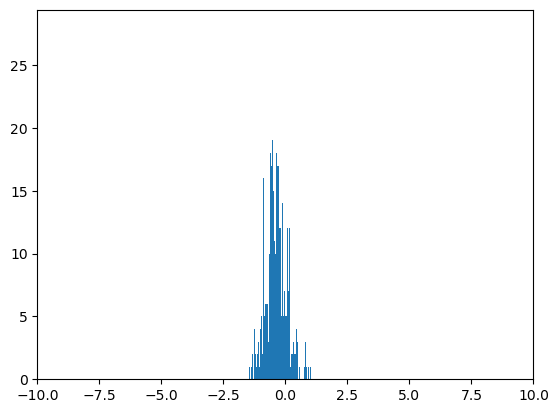

In [10]:
im = img.numpy()
vals = im.mean(axis=2).flatten()
b, bins, patches = plt.hist(vals, 255)
plt.xlim([-10,10])
plt.show()

In [11]:
# handpicked
training_frames = ['054603','004690','041511','066653','095791','027515','039878','033924','055528','079069','080591','031689','029112','016603','054294','023716','012087','037651','078343','092441','064250','049915','058552','085563','069149','070872','081235','070551','032017','013573','022172','057868','068618','046031','059796','064547','067235','008151','060925','042486','095289','006428','018330','014477','069702','074143','012855','015570','076104','007188','056589','005624','030744','091188','081027','047244','072148','070476','001598','092911','068441','074752','066210','074893','054376','077299','073463','014710','012518','026029','025367','049482','044973','058638','004389','059728','020001','055810','002121','071783','094283','083214','017129','059036','079631','025039','010816','050134','034205','062490','045259','060717','063143','098307','088565','053725','052044','048027','018275','062202','091375','032293','068341','082156','004405','095390','033726','039258','083308','030932','072886','020166','039516','027388','044267','057140','080706','073826','037548','030216','070537','035405','045895','065524','009800','027642','031096','033774','068459','020429','057534','033185','084541','011445','051583','077488','044605','040114','092749','032749','098527','088651','058430','018257','038137','018031','091489','096463','063323','094507','031653','038715','045466','048347','048471','088352','048444','086937','006267','019532','081591','078168','007878','072665','061657','032228','053232','069154','032287','097287','007525','004973','039239','065759','083862','029298','057074','027016','018598','075857','070719','063666','057304','089430','037865','034298','049958','015495','044514','019958','047688','076241','024330','007898','078749','068474','020855','068203','039810','044017','093466','008359','031596','042375','094094','081902','022717','076797','037197','095716','075933','054175','005620','045141','065791','020101','041751','018690','031536','020044','037931','069843','031837','003760','056031','071143','064852','022504','020273','074209','076250','026710','058968','091733','047381','099453','092464','037223','053557','000696','071176','053696','093797','004225','031230','059757','038343','084938','059802','091156']
validation_frames = ['006991','078804','084979','091392','044166','090972','079643','095808','070970','054747','084823','050405','082775','027479','046791','033661','014129','091542','036682','016446']

In [14]:
# get loaders
trainloaders, valloaders, testloader, completeTrainloader, completeValloader = ZODImporter(zod_frames=zod_frames,training_frames=training_frames,validation_frames=validation_frames).load_datasets(num_clients=1)

# create model
model = PT_Model()

# train supervised
trainer = train(model, completeTrainloader, completeValloader, nr_epochs=NUM_LOCAL_EPOCHS)

length of training_frames subset: 250
length of test_frames subset: 20


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]

  | Name  | Type   | Params
---------------------------------
0 | model | ResNet | 12.3 M
---------------------------------
12.3 M    Trainable params
0         Non-trainable params
12.3 M    Total params
49.011    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

/home/yasan/miniconda3/envs/zen/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:430: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 20 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
/home/yasan/miniconda3/envs/zen/lib/python3.9/site-packages/pytorch_lightning/trainer/call.py:54: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")


In [15]:
# validate 
validate(trainer, model, completeValloader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Validation: 0it [00:00, ?it/s]

None


In [16]:
# test
test(trainer, model, testloader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/home/yasan/miniconda3/envs/zen/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:430: PossibleUserWarning: The dataloader, test_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 20 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Testing: 0it [00:00, ?it/s]

None


In [17]:
moving_average = lambda x, w: np.convolve(x, np.ones(w), 'valid') / w

train_losses = [x['loss'].item() for x in model.inter_train_outputs]
val_losses = [x['loss'].item() for x in model.inter_val_outputs]

train_losses = moving_average(train_losses,10)
val_losses = moving_average(val_losses,10)

#step = len(train_losses)//len(val_losses)
#train_losses = [mean(train_losses[i:i+step]) for i in range(0,len(train_losses),step)]

plt.plot(train_losses[-100:])
plt.plot(val_losses[-100:])
plt.legend(["train", "val"])



KeyboardInterrupt



## load saved model

In [12]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

from IPython.core.display import display, HTML
display(HTML("<style>div.output_scroll { height: 200em; }</style>"))

/tmp/ipykernel_1693055/2267959546.py:4: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [29]:
model_path = "epoch=13-step=61404.ckpt"
model = PT_Model.load_from_checkpoint(model_path)

In [30]:
model.inter_train_outputs

[]

frame: 000152, loss: 1.0449870824813843
frame: 001527, loss: 0.6409617066383362
frame: 001625, loss: 1.6451060771942139
frame: 001841, loss: 1.4475535154342651
frame: 001892, loss: 1.3142943382263184
frame: 001998, loss: 1.0140643119812012
frame: 002040, loss: 0.5168652534484863
frame: 002250, loss: 2.057283639907837
frame: 002351, loss: 0.6927177906036377
frame: 002469, loss: 0.7021884322166443
frame: 002489, loss: 6.840422630310059
frame: 002618, loss: 0.6667186617851257
frame: 002646, loss: 1.0354118347167969
frame: 002656, loss: 1.1874200105667114
frame: 002659, loss: 1.7762231826782227


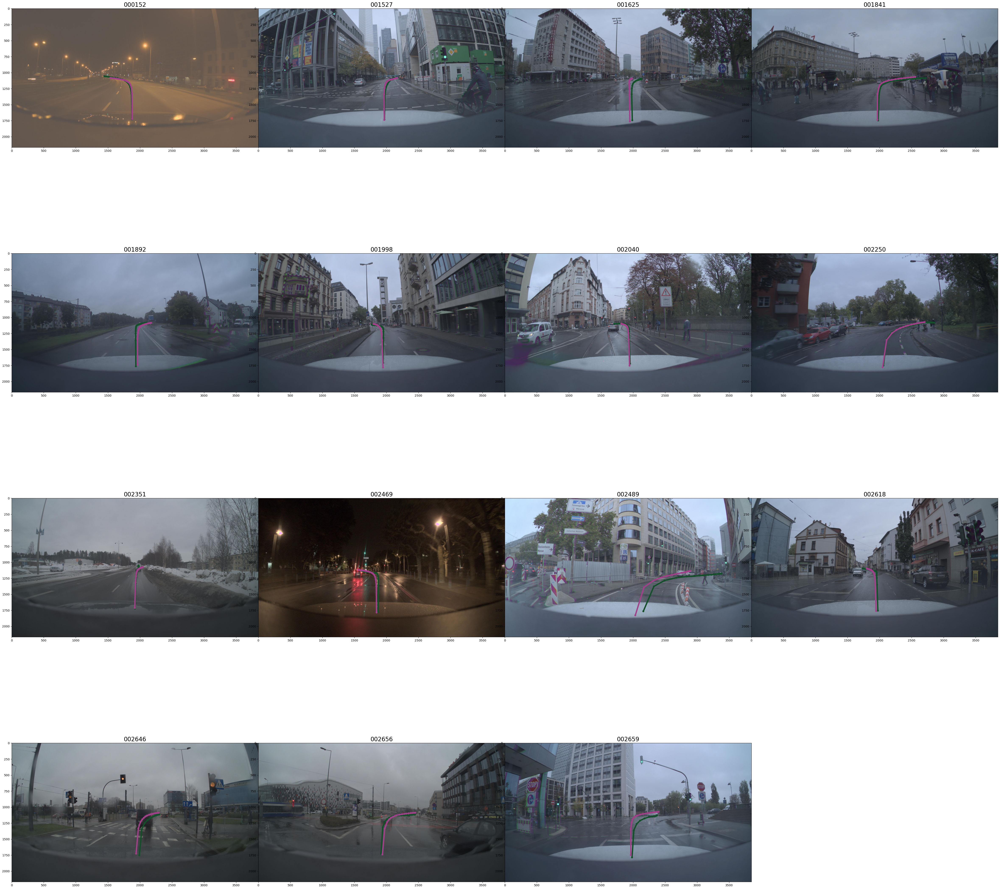

In [37]:
#frame_id = '083784'
#pred = predict(loaded_model.to(DEVICE), zod_frames, frame_id)
#visualize_HP_on_image(zod_frames, frame_id, pred)

frame_ids = ["000152", "001527", "001625", "001841", "001892", "001998", "002040", "002250", "002351", "002469", "002489", "002618", "002646", "002656", "002659"]
#frame_ids = ['039878','033924']
visualize_multiple(zod_frames, frame_ids, model)

In [ ]:
frame_ids = training_frames[:10]
visualize_multiple(zod_frames, frame_ids, model)

In [ ]:
frame_ids = validation_frames[:10]
visualize_multiple(zod_frames, frame_ids, model)

In [ ]:
def HP__ಠ_ಠ__(nr_train_images):
    num_epochs_needed_to_converge = -29.36556 + (225.4857 - -29.36556) / (1 + (nr_train_images / 1040.581) ** 0.5812742)
    num_epochs_needed_to_good_results = 2 * num_epochs_needed_to_converge
    num_hours_to_wait =  3207540 + (4.561429 - 3207540)/(1 + (num_epochs_needed_to_good_results/12699990)**1.020886)
    
    print("Using the following configuration: \n* batch size=8\n* lr=1e5\n* unfreezed Resnet18\n* normalized on imagenets mean & std\n* scaled input to 256x256\n* 85 meter distance\n* 90/10 train/val\n* L1 loss")
    print(f"\nThe network is estimated to take: \n-> {round(num_epochs_needed_to_converge)} epochs to converge to a solution that handles turns\n-> {round(num_epochs_needed_to_good_results)} epochs to get good results\n-> {round(num_hours_to_wait)} hours to run" + f" = {int((num_hours_to_wait * 60) // (24 * 60))} day(s), {int(((num_hours_to_wait * 60) % (24 * 60)) // 60)} hour(s), {int(((num_hours_to_wait * 60) % (24 * 60)) % 60)} minute(s)")

HP__ಠ_ಠ__(20000)

In [ ]:
import json

with open("frames_with_less_than_165m_hp.json") as f:
    short_frames = json.load(f)
    
UNUSED_FRAMES = set(short_frames)

In [ ]:
with open("intersection_ids.txt", 'r') as f:
    kil = f.read().splitlines()
    kil = [item.zfill(6) for item in kil]
    
#kil

In [ ]:
def save_to_json(path, data):
    with open(path, 'w') as f:
        f.write(json.dumps(data))
        
#save_to_json('kil_val.json', kil)

In [ ]:
def get_short_kil_ground_truth(zod_frames, frame_id):
    zod_frame = zod_frames[frame_id]

    # extract oxts
    oxts = zod_frame.oxts

    # get timestamp
    key_timestamp = zod_frame.info.keyframe_time.timestamp()

    try:
        # get posses associated with frame timestamp
        current_pose = oxts.get_poses(key_timestamp)

        # transform poses
        all_poses = oxts.poses[oxts.timestamps>=key_timestamp]
        transformed_poses = np.linalg.pinv(current_pose) @ all_poses

        # get translations
        translations = transformed_poses[:, :3, 3]

        # calculate acc diff distance
        distances = np.linalg.norm(np.diff(translations, axis=0), axis=1)
        accumulated_distances = np.cumsum(distances).astype(int).tolist()

        # get the poses that each have a point having a distance from TARGET_DISTANCES
        pose_idx = [accumulated_distances.index(i) for i in TARGET_DISTANCES]
        used_poses = transformed_poses[pose_idx]
    except:
        return frame_id
    
    points = used_poses[:, :3, -1]
    if(points.shape != (17, 3)):
        return frame_id
    
    return None

#get_short_kil_ground_truth(zod_frames, '030197')

#short_kil = [get_short_kil_ground_truth(zod_frames, frame_id) for frame_id in tqdm(kil)]

In [ ]:
#short_kil = [item for item in short_kil if item is not None]

In [ ]:
#len(short_kil)

In [ ]:
#clean_kil = [item for item in kil if item not in short_kil]

In [ ]:
#len(clean_kil)

In [ ]:
#save_to_json('kil_val.json', clean_kil)

In [ ]:
config = {
        "exp_id": 4,
        "type": "centralized",
        "agent_id":0,
        "output_size": 51,
        "image_size": 256,
        "run_pretrained": True,
        "batch_size": 8,
        "val_factor": 1,
        "subset_factor": 1,
        "use_gpu": True,
        "model": "resnet18", 
        "num_clients": 1,
        "num_global_rounds": 1,
        "num_local_epochs": 250,
        "print_debug_data": True,
        "num_workers": 10,
        "prefetch_factor": 32,
        "frames_image_mean": [0.337, 0.345, 0.367],
        "frames_image_std": [0.160, 0.180, 0.214],
        "dataset_root": "/mnt/ZOD",
        "zenseact_dataset_root": "/staging/dataset_donation/round_2",
        "checkpoint_path": None,
        "start_from_checkpoint": False,
        "use_ema": False,
        "dataset_division": "balanced",
        "validation_set": "kil",
        "learning_rate": 0.001,
        "target_distances": [5, 10, 15, 20, 25, 30, 35, 40, 50, 60, 70, 80, 95, 110, 125, 145, 165],
        "loss": "L1",
        "gpu_id": 1
    }
c = lambda a: config.get(a, None) 

class PT_Model(pl.LightningModule):
    def __init__(self, cid=0) -> None:
        super(PT_Model, self).__init__()
        
        self.model = None
        if(c('model') == 'resnet18'):
            self.model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        elif(c('model') == 'mobile_net'):
            self.model = models.mobilenet_v3_large(weights=models.MobileNet_V3_Large_Weights.IMAGENET1K_V1)
        elif(c('model') == 'mobile_netV2'):
            self.model = models.mobilenet_v2(weights=models.MobileNet_V2_Weights.DEFAULT)

        self.change_head_net()
        self.useEma = c('use_ema')
        self.ema = None

        if(self.useEma):
            self.ema = EMA(
                self.model,
                beta=0.995,
                update_after_step=100,
                power=3/4,
                inv_gamma=1.0
            )

        self.is_pretrained = True
        self.loss_fn = torch.nn.L1Loss()
        self.cid = cid
        
        # pytorch imagenet calculated mean/std
        self.mean=[0.485, 0.456, 0.406]
        self.std=[0.229, 0.224, 0.225]
        
        self.epoch_counter = 1
        self.tb_log = {}
        self.create_intermediate_steps()
        

    def forward(self, image):
        label = self.model(image)

        if(self.useEma):
            ema_label = self.ema(image)
            return label, ema_label

        return label, None

    def model_parameters(self):
        return self.model.fc.parameters()

    def change_head_net(self):
        num_ftrs = 0

        if(c('model') == 'resnet18'):
            num_ftrs = self.model.fc.in_features
        elif(c('model') == 'mobile_net'):
            num_ftrs = self.model.classifier[-1].in_features

        head_net = nn.Sequential(
            nn.Linear(num_ftrs, 1024, bias=True),
            nn.ReLU(inplace=True),
            nn.Linear(1024, 512, bias=True),
            nn.ReLU(inplace=True),
            nn.Linear(512, c('output_size'), bias=True),
        )

        if(c('model') == 'resnet18'):
            self.model.fc = head_net
        elif(c('model') == 'mobile_net'):
            self.model.classifier[-1] = head_net
            
    def shared_step(self, batch, batch_idx, stage, inter_outputs, ema_inter_outputs):
        image = batch["image"]
        label = batch["label"]

        logits_label, ema_logits_label = self.forward(image)
        logits_label = logits_label.unsqueeze(dim=1)
        loss = self.loss_fn(logits_label, label)

        if(self.useEma):
            ema_logits_label = ema_logits_label.unsqueeze(dim=1)
            ema_loss = self.loss_fn(ema_logits_label, label)

        ema_loss = ema_loss if(self.useEma) else None
        
        inter_outputs.append(loss.item())
        if(self.useEma):
            ema_inter_outputs.append(ema_loss.item())
            if(stage == 'train'):
                self.ema.update()

        return loss

    def shared_epoch_end(self, inter_outputs, ema_inter_outputs, stage):
        self.tb_log[f'{stage}_loss'] = np.mean(inter_outputs)
        
        if(self.useEma):
            self.tb_log[f'{stage}_ema_loss'] = np.mean(ema_inter_outputs) 

        self.log_dict(self.tb_log, prog_bar=True)
        if(stage == 'train'):
            self.updateTB(self.tb_log, stage)
            self.epoch_counter +=1

    def training_step(self, batch, batch_idx):
        loss = self.shared_step(batch, batch_idx, 'train', self.inter_train_outputs, self.inter_train_ema_outputs)
        return loss

    def on_train_epoch_end(self):
        return self.shared_epoch_end(self.inter_train_outputs, self.inter_train_ema_outputs, 'train')

    def validation_step(self, batch, batch_idx):
        loss = self.shared_step(batch, batch_idx, 'valid', self.inter_val_outputs, self.inter_val_ema_outputs)
        return loss

    def on_validation_epoch_end(self):
        return self.shared_epoch_end(self.inter_val_outputs, self.inter_val_ema_outputs, 'valid')

    def test_step(self, batch, batch_idx):
        loss = self.shared_step(batch, batch_idx, 'test', self.inter_test_outputs, self.inter_test_ema_outputs)
        return loss

    def on_test_epoch_end(self):
        return self.shared_epoch_end(self.inter_test_outputs, self.inter_test_ema_outputs, 'test')

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=c('learning_rate'))
    
    def compute_metrics(pred_trajectory, target_trajectory):
        # L1 and L2 distance: matrix of size BSx40x3
        L1_loss = torch.abs(pred_trajectory - target_trajectory)
        L2_loss = torch.pow(pred_trajectory - target_trajectory, 2)

        # BSx40x3 -> BSx3 average over the predicted points
        L1_loss = L1_loss.mean(axis=1)
        L2_loss = L2_loss.mean(axis=1)

        # split into losses for each axis and an avg loss across 3 axes
        # All returned tensors have shape (BS)
        return {
                'L1_loss':   L1_loss.mean(axis=1),
                'L1_loss_x': L1_loss[:, 0],
                'L1_loss_y': L1_loss[:, 1],
                'L1_loss_z': L1_loss[:, 2],
                'L2_loss':   L2_loss.mean(axis=1),
                'L2_loss_x': L2_loss[:, 0],
                'L2_loss_y': L2_loss[:, 1],
                'L2_loss_z': L2_loss[:, 2]}

    def updateTB(self, tb_log, stage):
        writer.add_scalars('Loss', tb_log, global_step=self.epoch_counter)
        #self.logger.experiment.add_scalars('Loss', tb_log, global_step=self.epoch_counter)
        self.create_intermediate_steps()

    def create_intermediate_steps(self):
        self.inter_train_outputs = []
        self.inter_train_ema_outputs = []

        self.inter_val_outputs = []
        self.inter_val_ema_outputs = []

        self.inter_test_outputs = []
        self.inter_test_ema_outputs = []
        self.tb_log = {}

    def set_TB_loggers(self, logger):
        self.epoch_logger = logger
        
        
#from torchinfo import summary
#model = PT_Model()
#summary(model, (8, 3, 256, 256))